In [1]:
# We import the packages along with other useful libraries.
%matplotlib inline
import astropy.units as u
import astropy.io.fits as fits
import numpy as np
from matplotlib.pyplot import *
from matplotlib import pyplot as plt
import vip_hci as vip
from hciplot import plot_frames, plot_cubes
import pyds9 as sao

In [2]:
# We import all the routines that will be used in this code.
from packaging import version
vvip = vip.__version__
print("VIP version: ", vvip)
if version.parse(vvip) < version.parse("1.0.0"):
    msg = "Please upgrade your version of VIP"
    msg+= "It should be 1.0.0 or above to run this notebook."
    raise ValueError(msg)
elif version.parse(vvip) <= version.parse("1.0.3"):
    from vip_hci.conf import VLT_NACO
    from vip_hci.medsub import median_sub
    from vip_hci.metrics import normalize_psf
    from vip_hci.negfc import (confidence, firstguess, mcmc_negfc_sampling, show_corner_plot, show_walk_plot,
                               speckle_noise_uncertainty)
    from vip_hci.pca import pca, pca_annular, pca_grid, pca_annulus
else:
    from vip_hci.config import VLT_NACO
    from vip_hci.fm import normalize_psf, cube_inject_companions, firstguess, cube_planet_free, mcmc_negfc_sampling
    from vip_hci.psfsub import median_sub, pca, pca_annular, pca_grid, pca_annulus

# common to all versions:
from vip_hci.fits import open_fits, write_fits, info_fits
from vip_hci.metrics import significance, snr, snrmap, contrast_curve, detection, throughput 
from vip_hci.var import fit_2dgaussian, frame_center
from vip_hci.preproc import (approx_stellar_position, cube_correct_nan, cube_crop_frames,
                             cube_detect_badfr_correlation, cube_fix_badpix_annuli,
                             cube_fix_badpix_clump, cube_fix_badpix_isolated,
                             cube_px_resampling, cube_recenter_2dfit, cube_recenter_dft_upsampling,
                             cube_recenter_satspots, cube_recenter_via_speckles, cube_shift,
                             frame_center_radon, frame_crop, frame_fix_badpix_isolated, frame_shift)

VIP version:  1.4.0


In [3]:
# Let's define the pixel scale for SPHERE (IRDIS)
mas = 12.25 * u.mas
pxscale_sphere = mas.to(u.arcsec)/u.arcsec
pxscale_sphere

<Quantity 0.01225>

## Loading and visualizing the data

In [4]:
# Let’s first inspect the fits file of the reference star
info_fits('/home/cvargas/sphere/AS209/Gaia-DR2-4326487275008600192_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305264/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits')

Filename: /home/cvargas/sphere/AS209/Gaia-DR2-4326487275008600192_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305264/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1038   (1024, 1024, 16, 2)   float32   


In [5]:
# Now we load all the data in memory with the open_fits function
cubename = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits'
cube_refname = '/home/cvargas/sphere/AS209/Gaia-DR2-4326487275008600192_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305264/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits'
psfname = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PSF_MASTER_CUBE-median_unsat.fits'
anglename = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PARA_ROTATION_CUBE-rotnth.fits'

cube = open_fits(cubename)
cube_ref = open_fits(cube_refname)
psf = open_fits(psfname)
angle = open_fits(anglename)

Fits HDU-0 data successfully loaded. Data shape: (2, 32, 1024, 1024)
Fits HDU-0 data successfully loaded. Data shape: (2, 16, 1024, 1024)
Fits HDU-0 data successfully loaded. Data shape: (2, 5, 64, 64)
Fits HDU-0 data successfully loaded. Data shape: (32,)


In [6]:
cubee = fits.open(cubename)

New shape: (2, 16, 150, 150)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time,lambda]   (flux)
:Cube_shape	[150, 150, 16, 2]


:HoloMap   [time,lambda]
   :Image   [x,y]   (flux)
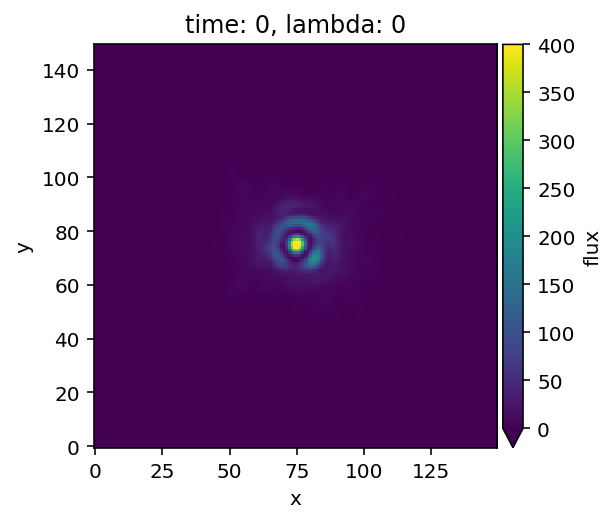
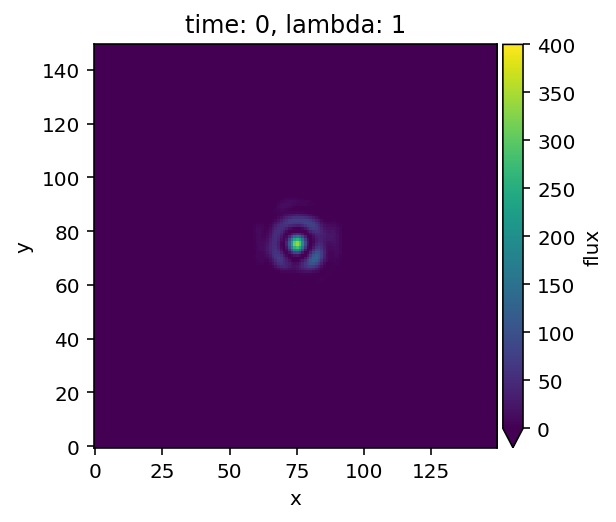
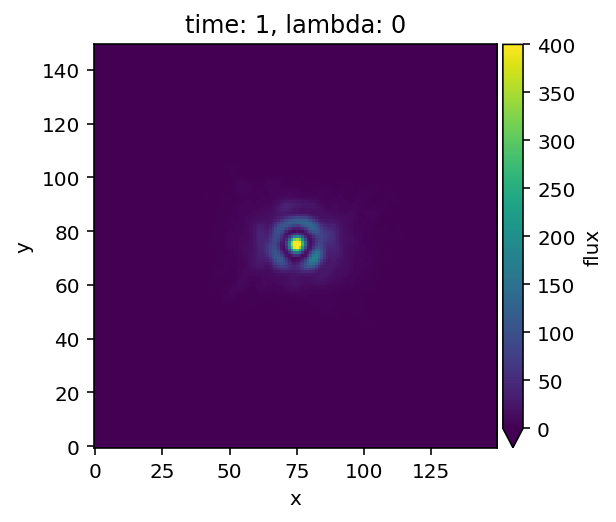
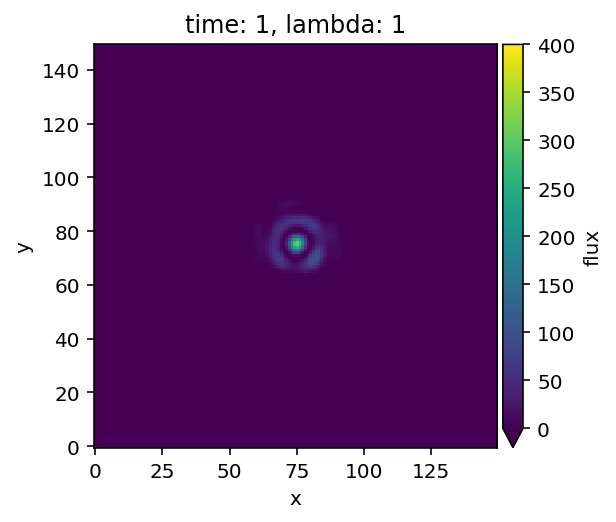
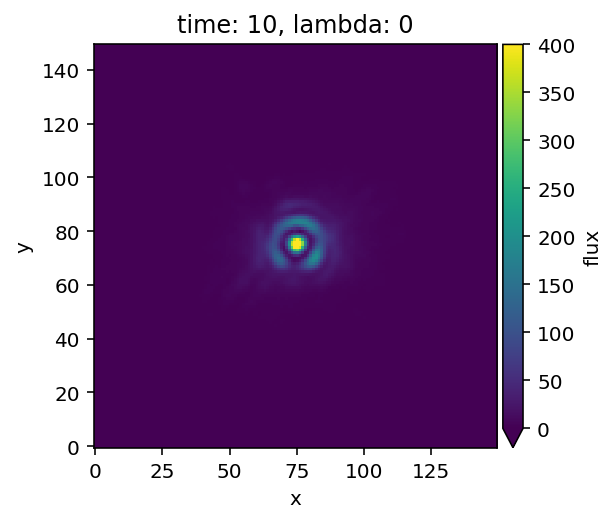
...
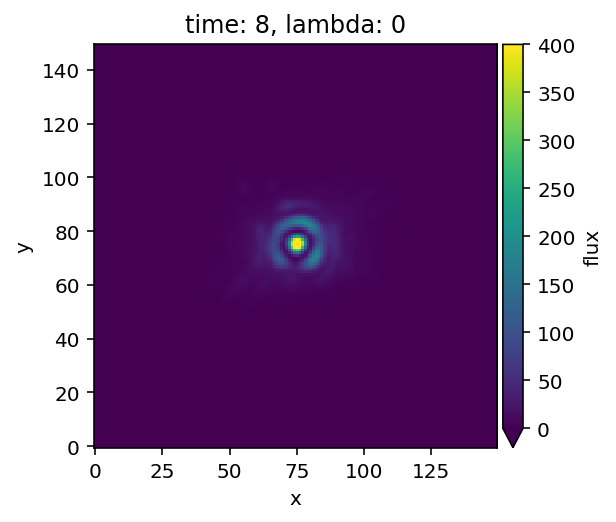
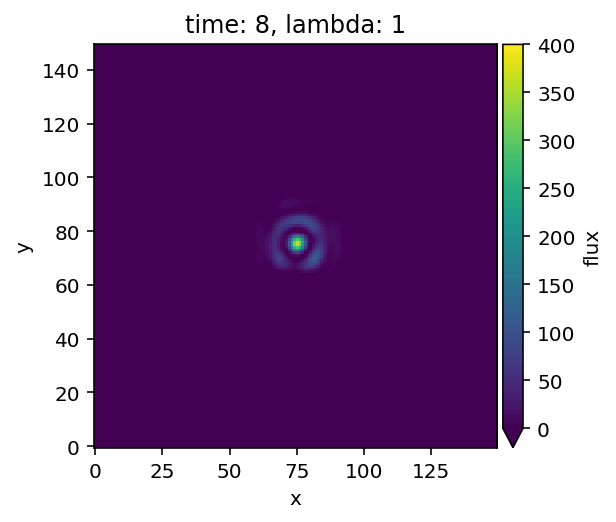
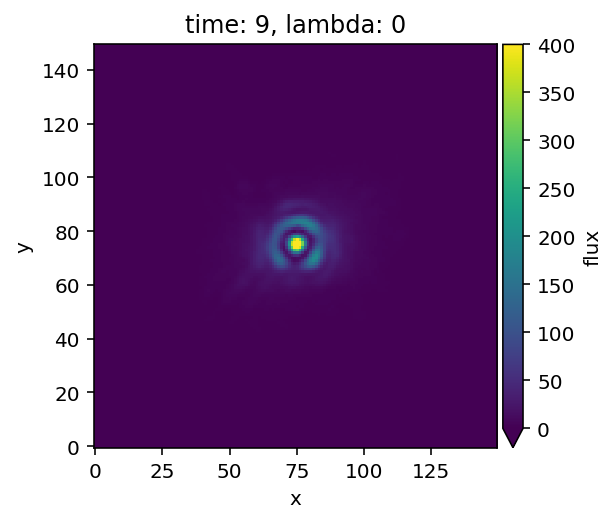
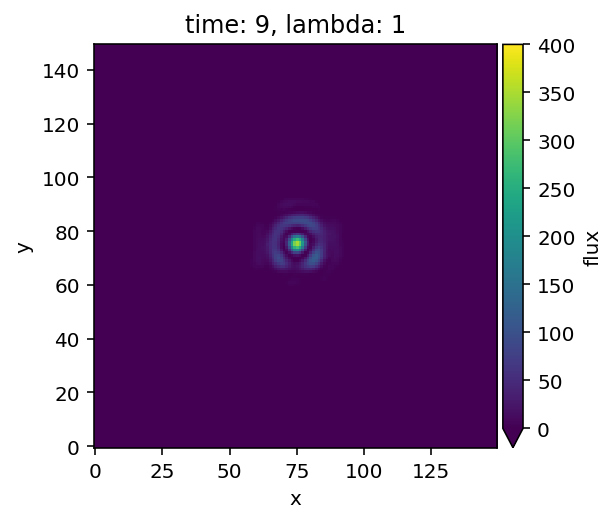
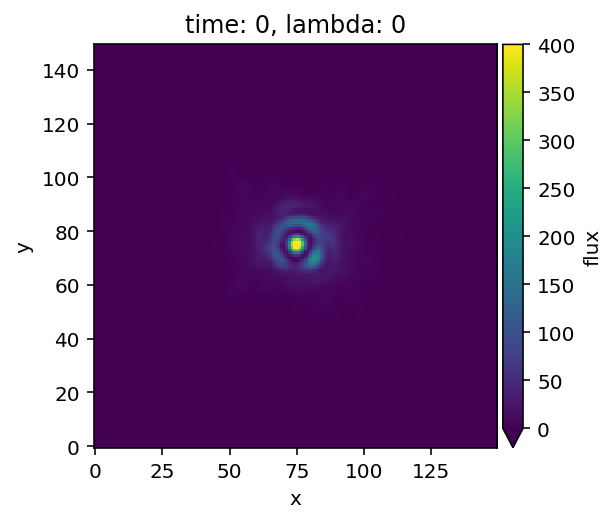

In [7]:
# Let's visualize the cube of the reference star
plot_cubes(cube_crop_frames(cube_ref,150), dynamic=False, vmin=0, vmax=400)

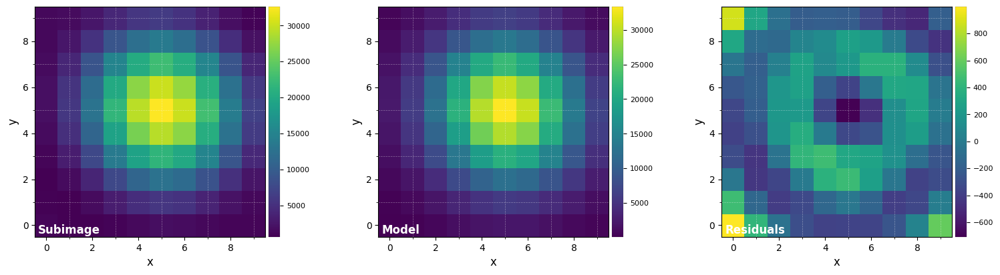

FWHM_y = 5.059103915671366
FWHM_x = 5.256553442859861 

centroid y = 32.063358384209046
centroid x = 32.07111407369198
centroid y subim = 5.063358384209048
centroid x subim = 5.071114073691982 

amplitude = 33385.36333190134
theta = -33.56556332668014


In [30]:
# Let’s measure the Full-Width Half-Maximum (FWHM) by fitting a 2D Gaussian to the core of the unsaturated non-coronagraphic PSF.
%matplotlib inline
DF_fit_K1 = fit_2dgaussian(psf[0,0,:,:], crop=True, cropsize=10, debug=True, full_output=True)

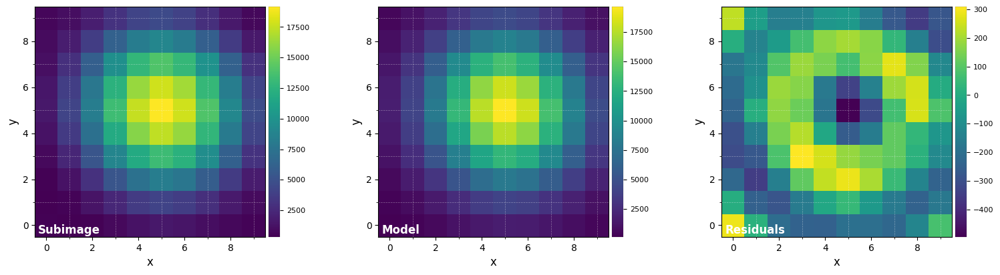

FWHM_y = 5.5104347440399515
FWHM_x = 5.356480278152726 

centroid y = 32.08024906545951
centroid x = 32.0708619028157
centroid y subim = 5.0802490654595145
centroid x subim = 5.0708619028156985 

amplitude = 19687.97511362439
theta = -310.92919903886366


In [31]:
DF_fit_K2 = fit_2dgaussian(psf[1,0,:,:], crop=True, cropsize=10, debug=True, full_output=True)

In [32]:
fwhm_sphere_K1 = np.mean([DF_fit_K1['fwhm_x'], DF_fit_K1['fwhm_y']])
print(fwhm_sphere_K1)

5.157828679265613


In [34]:
fwhm_sphere_K2 = np.mean([DF_fit_K2['fwhm_x'], DF_fit_K2['fwhm_y']])
print(fwhm_sphere_K2)

5.433457511096339


In [63]:
# Let's normalize the flux to one in a 1xFWHM aperture and crop the PSF array
psfn_K1 = normalize_psf(psf[0,0,:,:], fwhm_sphere_K1, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 500880.322


In [64]:
psfn_K2 = normalize_psf(psf[1,0,:,:], fwhm_sphere_K2, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 327218.705


## Pre-processing

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:25:08
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:21.722849
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


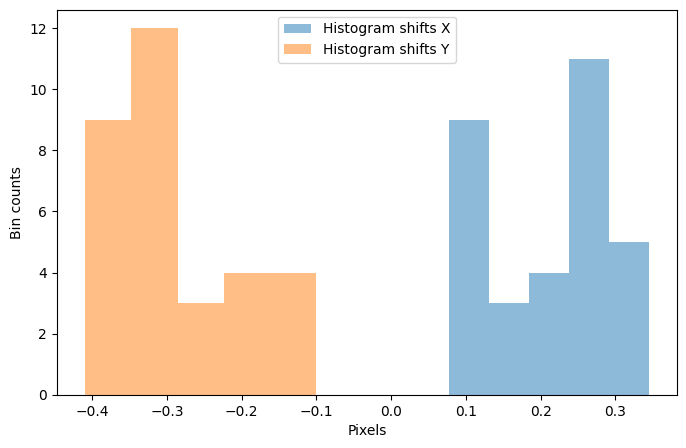

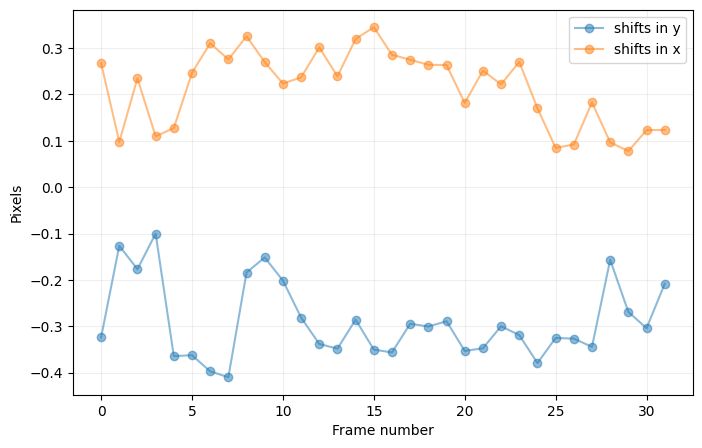

In [37]:
cube_K1, shy_K1, shx_K1 = cube_recenter_2dfit(cube[0,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K1, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:25:40
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:09.570676
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


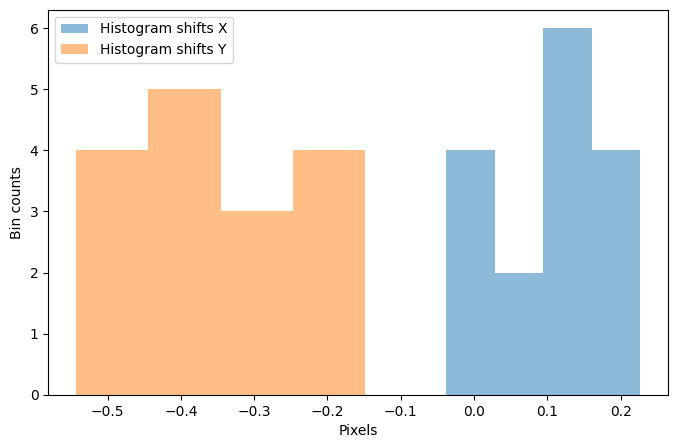

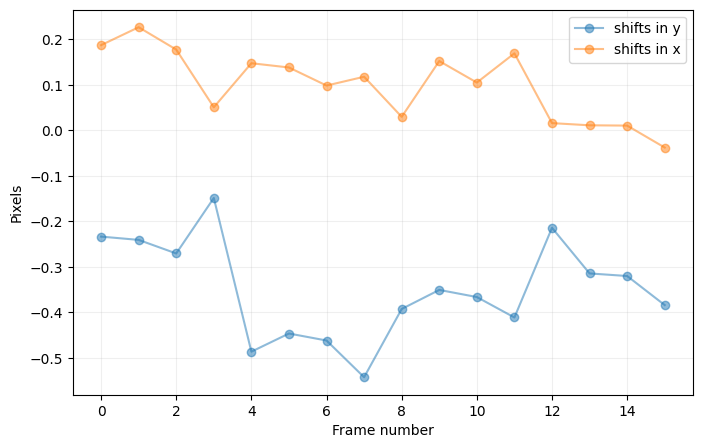

In [38]:
cube_ref_K1, shy_ref_K1, shx_ref_K1 = cube_recenter_2dfit(cube_ref[0,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K1, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

New shape: (10, 10)
New shape: (10, 10)


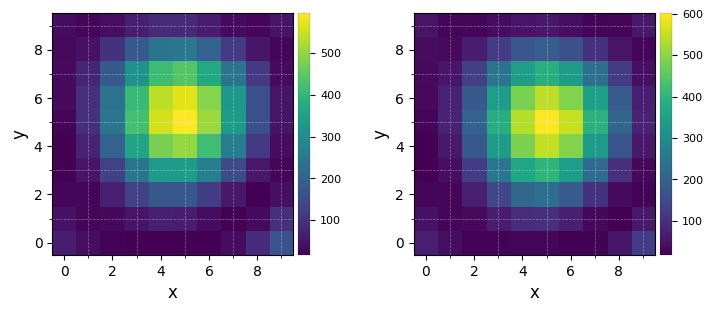

In [39]:
plot_frames((frame_crop(cube[0,0,:,:], 10),frame_crop(cube_K1[0], 10)), grid=True, size_factor=4)

New shape: (10, 10)
New shape: (10, 10)


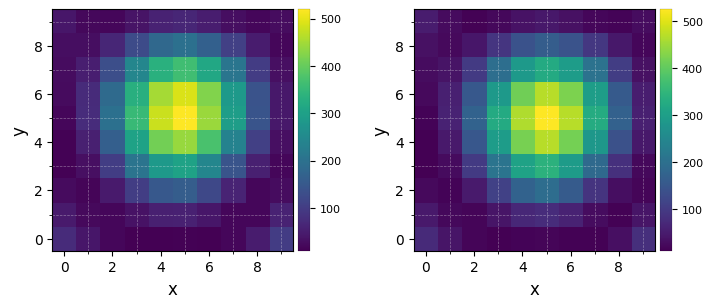

In [40]:
plot_frames((frame_crop(cube_ref[0,0,:,:], 10),frame_crop(cube_ref_K1[0], 10)), grid=True, size_factor=4)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:25:55
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:19.054935
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


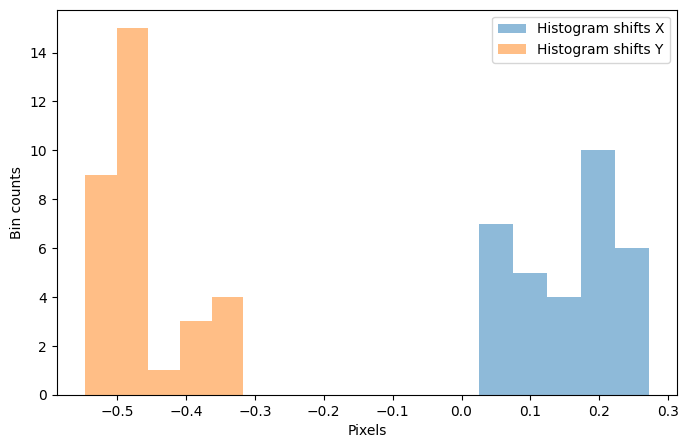

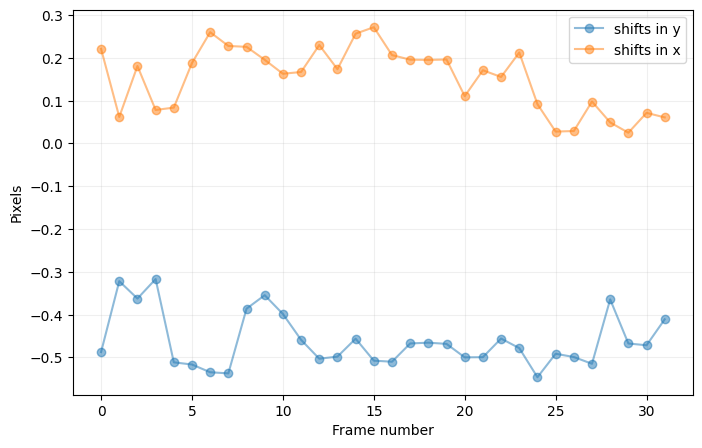

In [41]:
cube_K2, shy_K2, shx_K2 = cube_recenter_2dfit(cube[1,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K2, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:26:17
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:09.484687
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


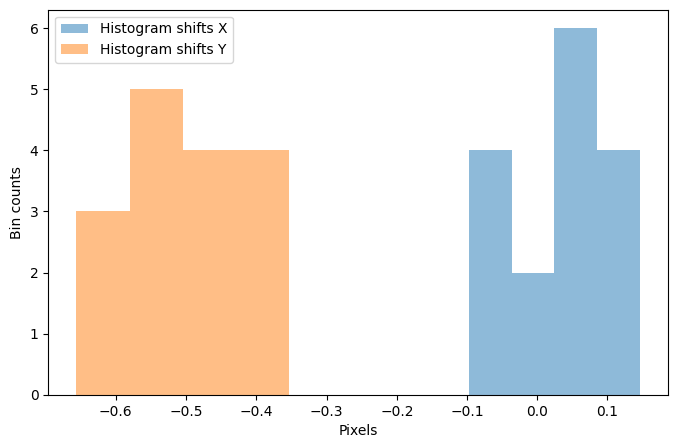

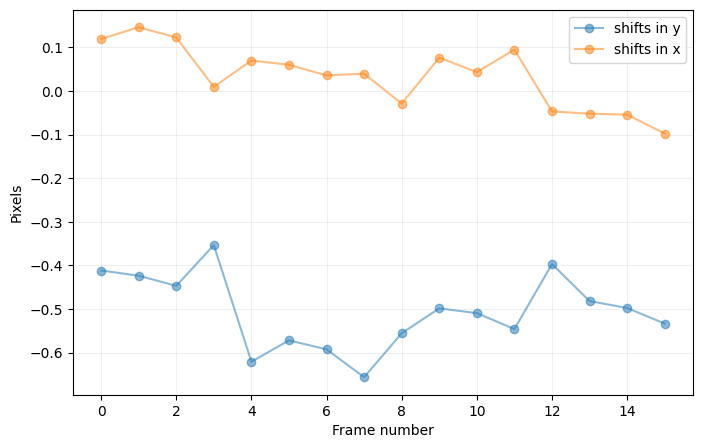

In [42]:
cube_ref_K2, shy_ref_K2, shx_ref_K2 = cube_recenter_2dfit(cube_ref[1,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K2, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

New shape: (10, 10)
New shape: (10, 10)


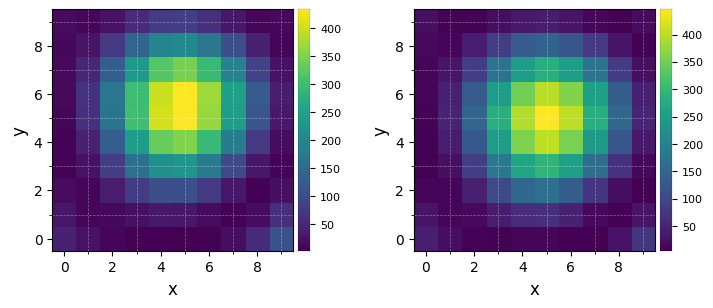

In [43]:
plot_frames((frame_crop(cube[1,0,:,:], 10),frame_crop(cube_K2[0], 10)), grid=True, size_factor=4)

New shape: (10, 10)
New shape: (10, 10)


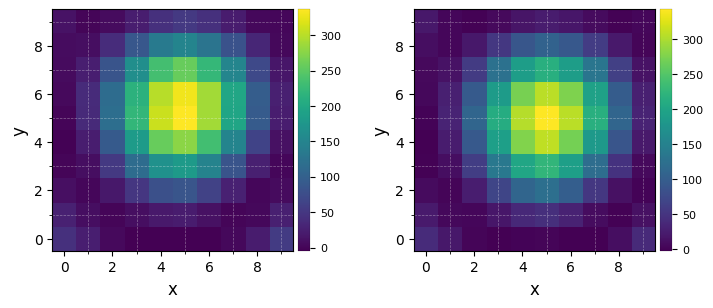

In [44]:
plot_frames((frame_crop(cube_ref[1,0,:,:], 10),frame_crop(cube_ref_K2[0], 10)), grid=True, size_factor=4)

## Model PSF subtraction for RDI

In [49]:
# We set the preferred method to be used for image rotation.
imlib = 'vip-fft'
interpolation=None

In [50]:
fr_pca_K1 = pca(cube_K1, angle, cube_ref=cube_ref_K1, ncomp=10, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:40:16
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 89.059 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done vectorizing the frames. Matrix shape: (16, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Done de-rotating and combining
Running time:  0:03:40.795005
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [51]:
fr_pca_K2 = pca(cube_K2, angle, cube_ref=cube_ref_K2, ncomp=10, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 18:43:57
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 87.949 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done vectorizing the frames. Matrix shape: (16, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Done de-rotating and combining
Running time:  0:03:39.574489
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (210, 210)


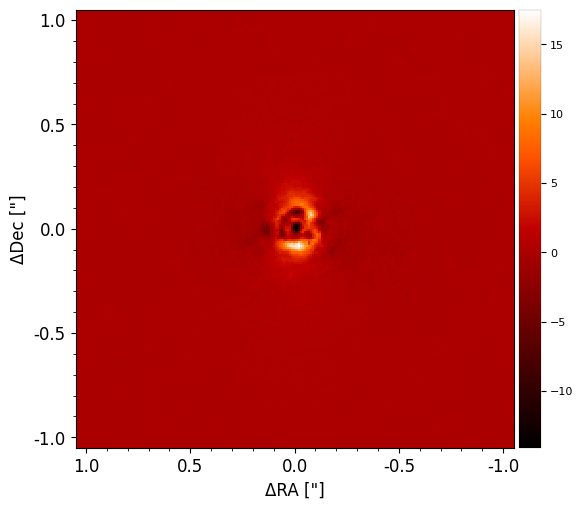

In [61]:
%matplotlib inline
plot_frames((frame_crop(fr_pca_K1, 210)), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

New shape: (210, 210)


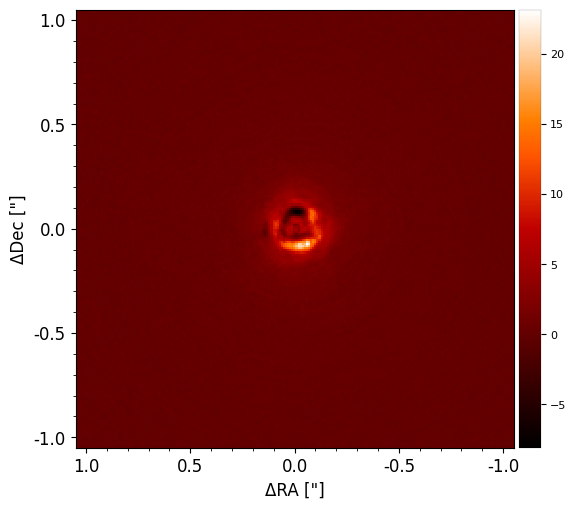

In [62]:
plot_frames((frame_crop(fr_pca_K2, 210)), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

In [52]:
# Let's save the resulting arrays
#np.savetxt('AS209_fr_pca_K1_RDI_2021-04-06', fr_pca_K1)
#np.savetxt('AS209_fr_pca_K2_RDI_2021-04-06', fr_pca_K2)

In [56]:
from numpy import loadtxt

fr_pca_K1 = loadtxt('AS209_fr_pca_K1_RDI_2021-04-06')
fr_pca_K2 = loadtxt('AS209_fr_pca_K2_RDI_2021-04-06')

## Plotting the disk structures

In [19]:
from astropy.visualization import (AsinhStretch, LinearStretch, LogStretch, ImageNormalize)
from matplotlib.patches import Ellipse
import matplotlib.gridspec as gridspec
import scipy.ndimage
from matplotlib.offsetbox import AnchoredOffsetbox, AuxTransformBox, DrawingArea, TextArea, VPacker
from matplotlib.patches import Rectangle

In [20]:
fig = plt.figure(figsize=(10, 9))
gs  = gridspec.GridSpec(2, 2, figure = fig, width_ratios=(1, 1), height_ratios=(1, 1))
norm = ImageNormalize(vmin=-5,vmax=5, stretch=LinearStretch())
fig_size = 1.2

<Figure size 1000x900 with 0 Axes>

In [21]:
aoff, doff = 0,0 #-0.89,0.9
RA_CO  = -12.25e-3 * (np.arange(cubee[0].header['NAXIS1'])-(512.512))
DEC_CO = 12.25e-3 * (np.arange(cubee[0].header['NAXIS2'])-(512.512))
ext_CO = (np.max(RA_CO)-aoff, np.min(RA_CO)-aoff, np.min(DEC_CO)-doff, np.max(DEC_CO)-doff)

In [22]:
def mk_ellipse(x0,y0,R,incl,PA, npts=200):
    phi = 2.*np.pi*np.arange(npts)/(npts-1.)
    incl_rad = incl * np.pi/180.
    PA_rad = (PA) * np.pi/180.
    xell = R*np.cos(phi)*np.cos(incl_rad)
    yell = R*np.sin(phi)
    xrot = ( (xell)*np.cos(PA_rad) + (yell)*np.sin(PA_rad) ) + x0
    yrot = (-(xell)*np.sin(PA_rad) + (yell)*np.cos(PA_rad) ) + y0
    return [xrot, yrot]

In [23]:
#gap radius, offsets,inclination and position angle
g1 = 503e-3
x0g1, y0g1 = -2e-3, -4e-3
ig1 = 35.8
PAg1 = 86.1

g2 = 872e-3
x0g2, y0g2 = 1e-3, 0e-3
ig2 = 35
PAg2 = 85.6

#ring radius, offsets,inclination and position angle
r1 = 992.9e-3
x0r1, y0r1 = -0.8e-3, -4.4e-3 # consider this as outer disk offsets
ir1 = 34.92
PAr1 = 85.7

r2 = 612.8e-3
x0r2, y0r2 = 0.2e-3, 2.1e-3 # consider this as outer disk offsets
ir2 = 34.92
PAr2 = 85.6

In [24]:
#gap ellipse
xg1, yg1 = mk_ellipse(x0g1,y0g1,g1,ig1,PAg1,5000)
xg2, yg2 = mk_ellipse(x0g2,y0g2,g2,ig2,PAg2,5000)
xr1, yr1 = mk_ellipse(x0r1,y0r1,r1,ir1,PAr1,500)
xr2, yr2 = mk_ellipse(x0r2,y0r2,r2,ir2,PAr2,500)

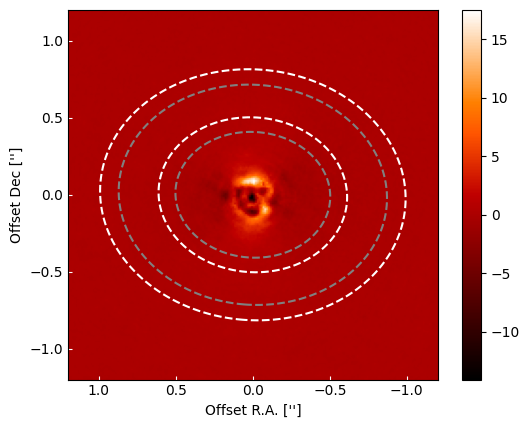

In [57]:
ax1 = fig.add_subplot(gs[0,0])
masked_array = np.ma.array(fr_pca_K1, mask=np.isnan(fr_pca_K1))
im1 = plt.imshow(masked_array, extent=ext_CO, cmap = 'gist_heat')
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
#plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.5')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.5')
plt.colorbar()
plt.show()

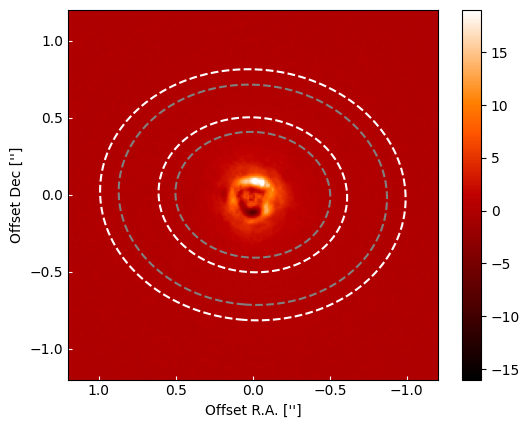

In [58]:
ax2 = fig.add_subplot(gs[0,0])
masked_array2 = np.ma.array(fr_pca_K2, mask=np.isnan(fr_pca_K2))
im2 = plt.imshow(masked_array2, extent=ext_CO, cmap = 'gist_heat', vmin = -16, vmax = 19)
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
#plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.5')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.5')
plt.colorbar()
plt.show()

## Throughput 

In [16]:
res_thr = throughput(cube, angle, psfn, fwhm_sphere, ncomp=15,
                     algo=pca, nbranch=1, full_output=True)

NameError: name 'psfn' is not defined

## Injecting fake planets

In [ ]:
imlib2 = 'opencv'
interpolation2='lanczos4' #'biquintic'
svd_mode = 'lapack'

### Injecting one fake planet

In [ ]:
# parameters of the fake planet
rad_fc = 10
theta_fc = 150
flux_fc = 400.

gt = [rad_fc, theta_fc, flux_fc]

In [ ]:
cubefc = cube_inject_companions(cube, psf_template=psfn, angle_list=angle, flevel=flux_fc, plsc=pxscale_sphere,
                                rad_dists=[rad_fc], theta=theta_fc, n_branches=1,
                                imlib=imlib2, interpolation=interpolation2)

New shape: (32, 100, 100)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time]   (flux)
:Cube_shape	[100, 100, 32]


:HoloMap   [time]
   :Image   [x,y]   (flux)
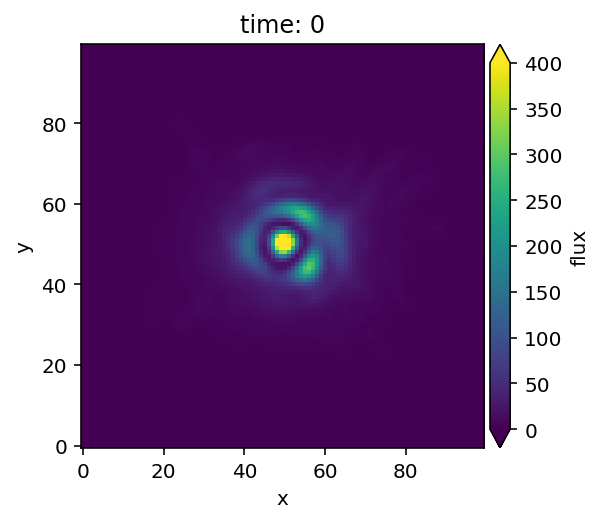
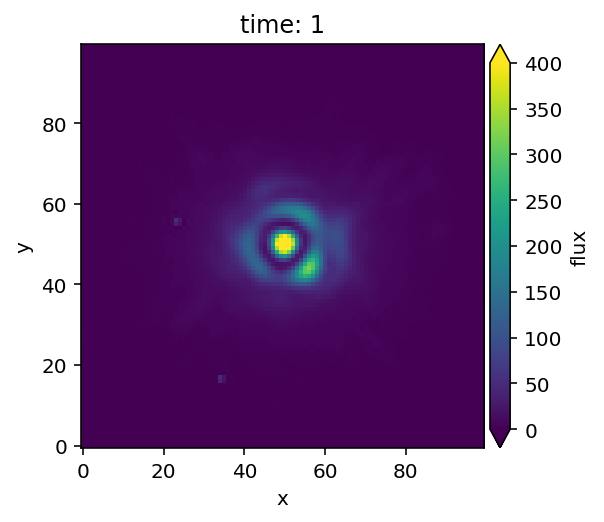
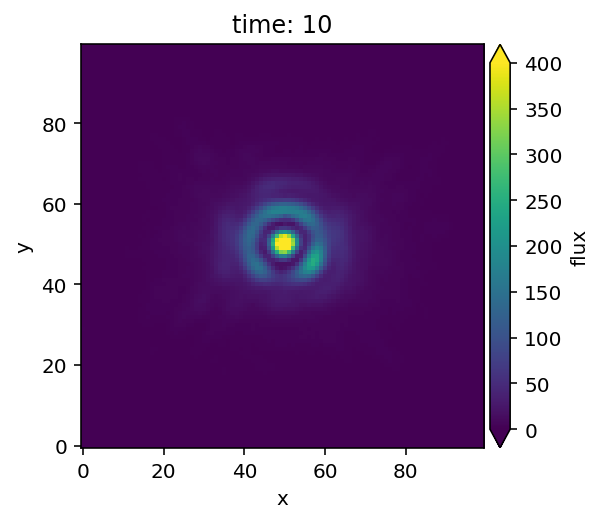
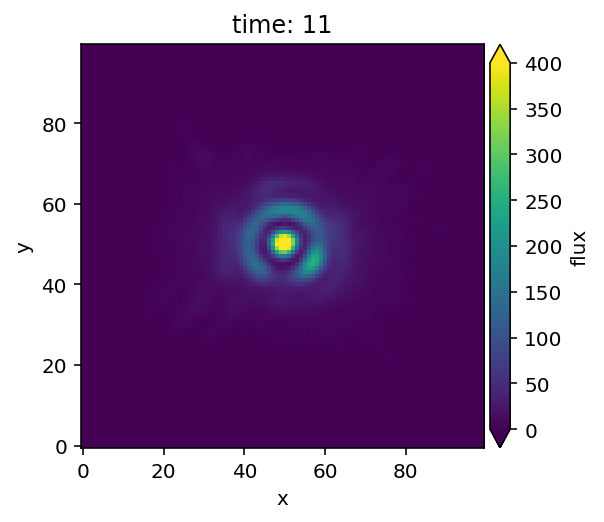
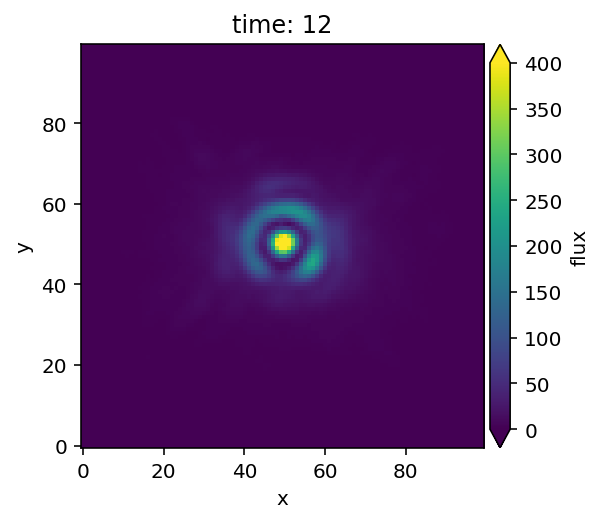
...
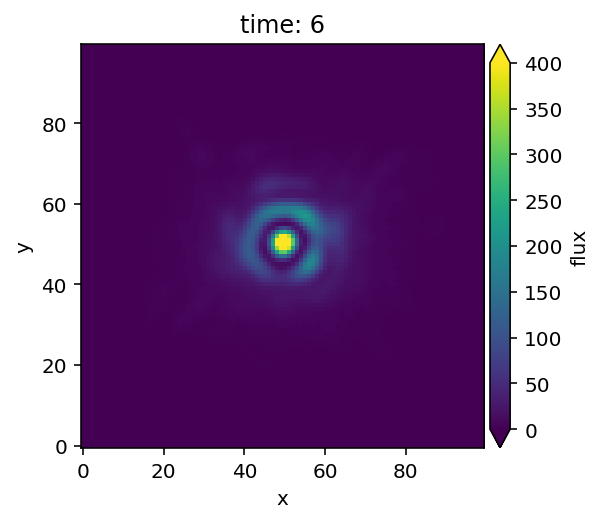
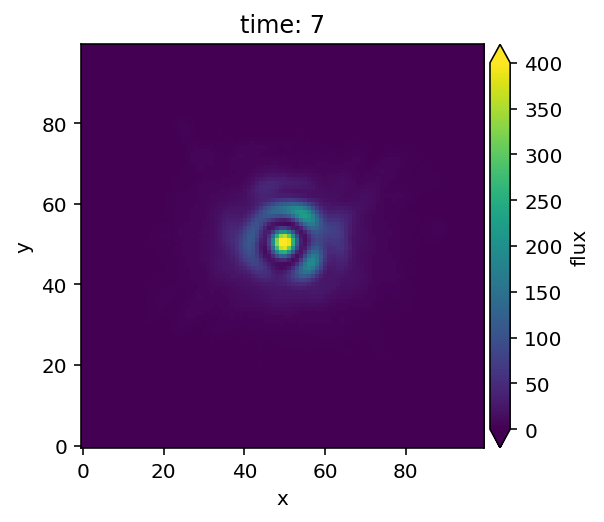
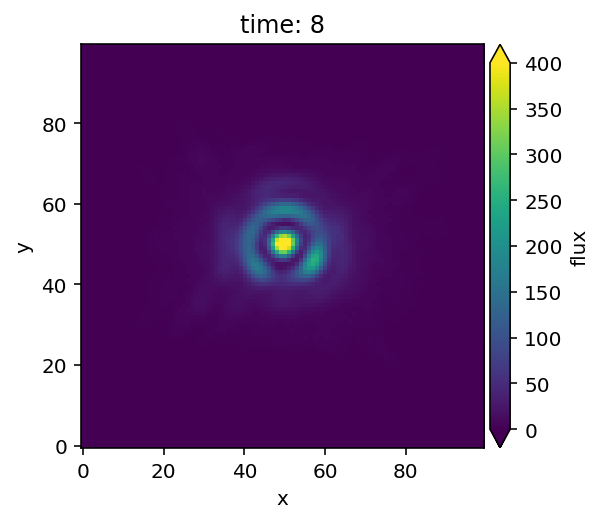
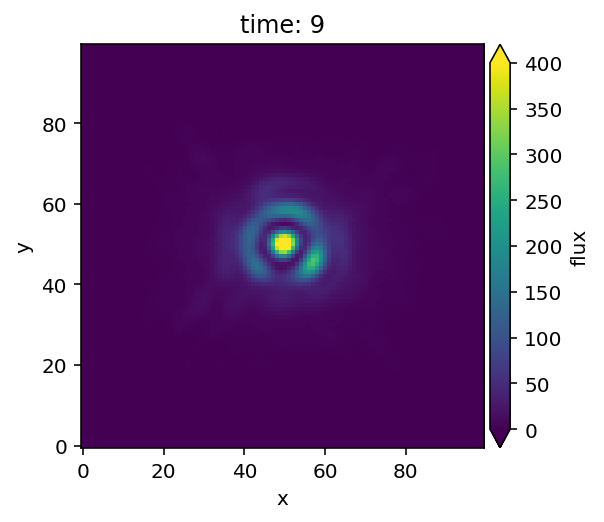
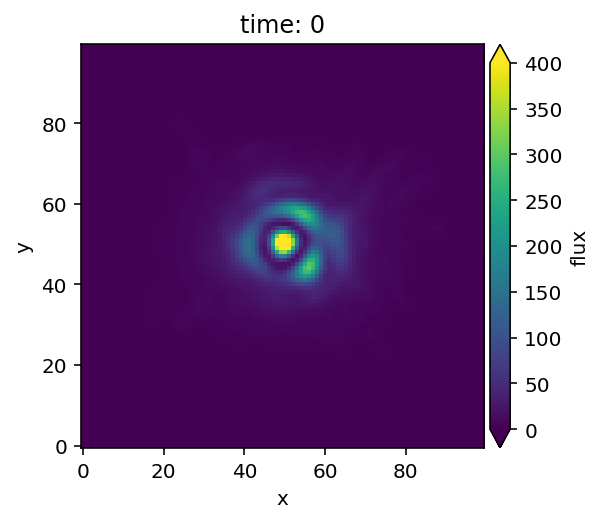

In [ ]:
# Let's visualize the cube with the fake planet
plot_cubes(cube_crop_frames(cubefc,100), dynamic=False, vmin=0, vmax=400)

In [ ]:
fr_pca_fc = pca(cubefc, angle, cube_ref=cube_ref, ncomp=10, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-22 20:08:19
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 120.562 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done vectorizing the frames. Matrix shape: (16, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)


Done de-rotating and combining
Running time:  0:04:00.976248
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (210, 210)


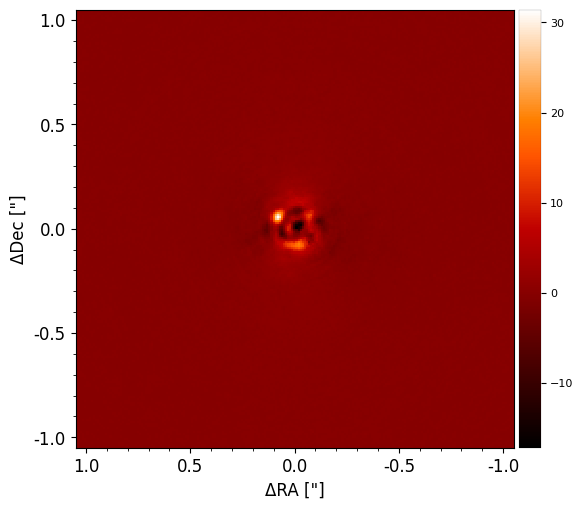

In [ ]:
%matplotlib inline
plot_frames((frame_crop(fr_pca_fc, 210)), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

In [ ]:
cy, cx = frame_center(cube[0])
x_fc = cx + rad_fc*np.cos(np.deg2rad(theta_fc))
y_fc = cy + rad_fc*np.sin(np.deg2rad(theta_fc))

xy_test = (x_fc, y_fc)
print('({:.1f}, {:.1f})'.format(xy_test[0],xy_test[1]))

(503.3, 517.0)


――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-07-19 10:07:05
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:01.760391
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Number of steps 16
Optimal number of PCs = 3, for S/N=3.413
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 503.3, 517.0
Flux in a centered 1xFWHM circular aperture = 522.634
Central pixel S/N = 4.777
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 3.413
Max S/N (shifting the aperture center) = 5.401
stddev S/N (shifting the aperture center) = 1.308



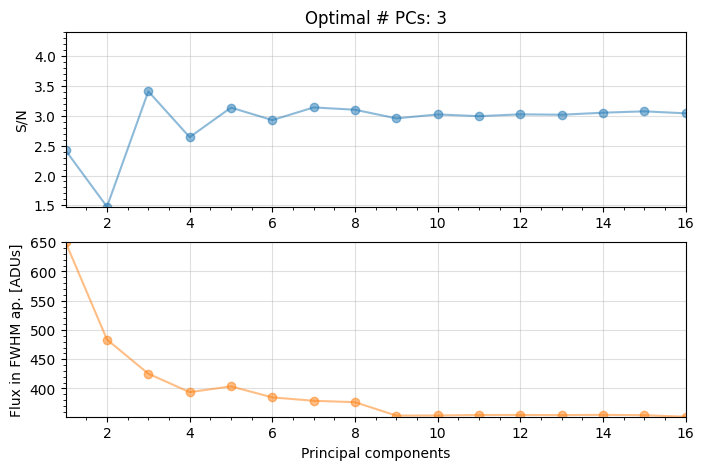

In [ ]:
res_opt = pca_grid(cubefc, angle, cube_ref=cube_ref, fwhm=fwhm_sphere, range_pcs=(1,16,1), source_xy=xy_test,
                       imlib=imlib2, interpolation=interpolation2, full_output=True, plot=True)

In [ ]:
_, final_opt, _, opt_npc = res_opt

In [ ]:
opt_npc

3

In [ ]:
res_opt

New shape: (110, 110)


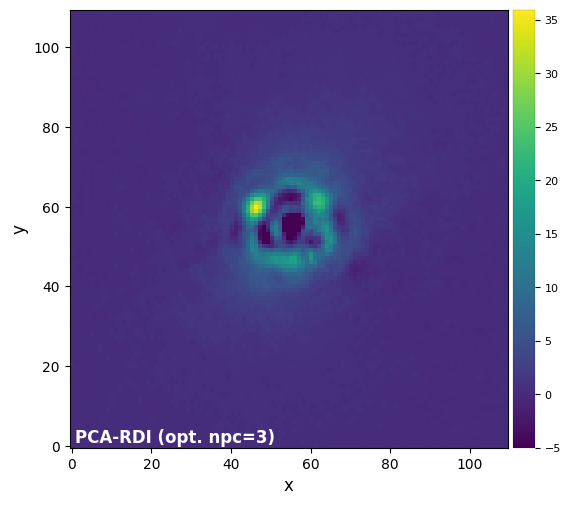

In [ ]:
%matplotlib inline
plot_frames(frame_crop(final_opt, 110), label='PCA-RDI (opt. npc={:.0f})'.format(opt_npc),
            dpi=100, vmin=-5, colorbar=True, circle=xy_test, cmap = 'gist_heat')

Now let's check how good is the sustraction by characterizing the planet (and changing ncomp)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-07-19 10:14:21
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [503.33974596215563,517.0], running ...
Step | flux    | chi2r
1/30   0.100   1.133
2/30   0.149   1.132
3/30   0.221   1.132
4/30   0.329   1.132
5/30   0.489   1.131
6/30   0.728   1.130
7/30   1.083   1.128
8/30   1.610   1.126
9/30   2.395   1.123
10/30   3.562   1.118
11/30   5.298   1.111
12/30   7.880   1.100
13/30   11.721   1.085
14/30   17.433   1.062
15/30   25.929   1.028
16/30   38.566   0.980
17/30   57.362   0.910
18/30   85.317   0.810
19/30   126.896   0.676
20/30   188.739   0.507
21/30   280.722   0.317
22/30   417.532   0.178
23/30   621.

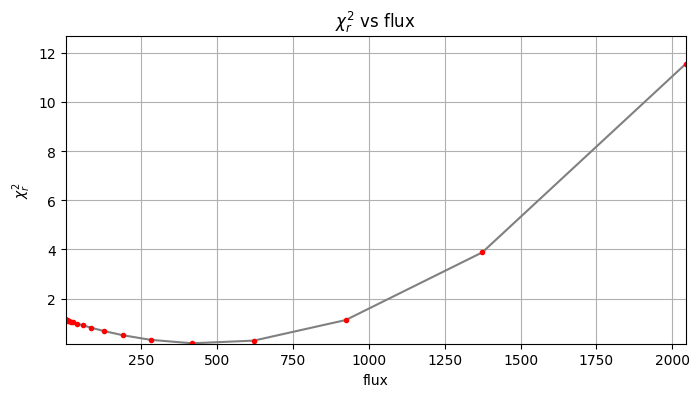

Planet 0: preliminary position guess: (r, theta)=(10.0, 150.0)
Planet 0: preliminary flux guess: 417.5
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 103, nfev: 235, chi2r: 0.08271580129056363
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(11.008, 146.627, 569.624) at 
          (X,Y)=(502.81, 518.06)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:28:38.320229
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
r_0, theta_0, f_0 = firstguess(cubefc, angle, psfn, ncomp=3, planets_xy_coord=[xy_test],
                                  fwhm=fwhm_sphere, cube_ref=cube_ref, f_range=None, simplex=True, imlib=imlib2,
                                  interpolation=interpolation2, plot=True, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-19 15:14:09
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [503.33974596215563,517.0], running ...
Step | flux    | chi2r
1/30   0.100   0.984
2/30   0.149   0.984
3/30   0.221   0.984
4/30   0.329   0.983
5/30   0.489   0.983
6/30   0.728   0.982
7/30   1.083   0.981
8/30   1.610   0.979
9/30   2.395   0.976
10/30   3.562   0.972
11/30   5.298   0.966
12/30   7.880   0.957
13/30   11.721   0.944
14/30   17.433   0.925
15/30   25.929   0.897
16/30   38.566   0.857
17/30   57.362   0.798
18/30   85.317   0.714
19/30   126.896   0.598
20/30   188.739   0.447
21/30   280.722   0.267
22/30   417.532   0.109
23/30   621.

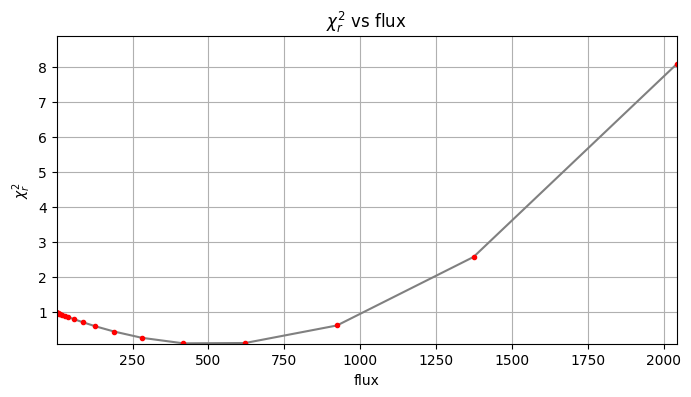

Planet 0: preliminary position guess: (r, theta)=(10.0, 150.0)
Planet 0: preliminary flux guess: 417.5
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 103, nfev: 245, chi2r: 0.047351953145619984
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(10.901, 150.030, 574.221) at 
          (X,Y)=(502.56, 517.45)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:06:56.422093
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
r_lo, theta_lo, f_lo = firstguess(cubefc, angle, psfn, ncomp=7, planets_xy_coord=[xy_test],
                                  fwhm=fwhm_sphere, cube_ref=cube_ref, f_range=None, simplex=True, imlib=imlib2,
                                  interpolation=interpolation2, plot=True, verbose=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-19 15:22:55
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [503.33974596215563,517.0], running ...
Step | flux    | chi2r
1/30   0.100   0.828
2/30   0.149   0.828
3/30   0.221   0.827
4/30   0.329   0.827
5/30   0.489   0.826
6/30   0.728   0.826
7/30   1.083   0.825
8/30   1.610   0.823
9/30   2.395   0.820
10/30   3.562   0.817
11/30   5.298   0.811
12/30   7.880   0.803
13/30   11.721   0.791
14/30   17.433   0.773
15/30   25.929   0.747
16/30   38.566   0.708
17/30   57.362   0.652
18/30   85.317   0.575
19/30   126.896   0.471
20/30   188.739   0.340
21/30   280.722   0.195
22/30   417.532   0.091
23/30   621.

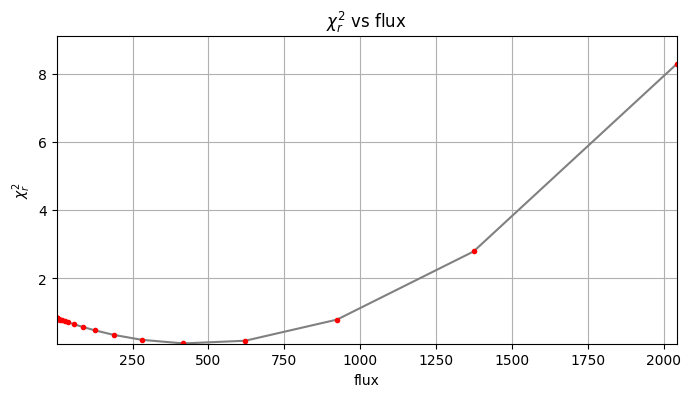

Planet 0: preliminary position guess: (r, theta)=(10.0, 150.0)
Planet 0: preliminary flux guess: 417.5
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 93, nfev: 223, chi2r: 0.03553346041086558
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(11.140, 150.026, 532.724) at 
          (X,Y)=(502.35, 517.57)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:06:15.721694
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
r_hi, theta_hi, f_hi = firstguess(cubefc, angle, psfn, ncomp=10, planets_xy_coord=[xy_test],
                                  fwhm=fwhm_sphere, cube_ref=cube_ref, f_range=None, simplex=True, imlib=imlib2,
                                  interpolation=interpolation2, plot=True, verbose=True)

##### Planet subtraction

In [ ]:
plpar_fc = [(r_0[0], theta_0[0], f_0[0])]

NameError: name 'r_0' is not defined

In [ ]:
cube_emp = cube_planet_free(plpar_fc, cubefc, angle, psfn, imlib=imlib2, interpolation=interpolation2)

In [ ]:
from vip_hci.preproc import cube_derotate
from vip_hci.config import time_ini, timing
t0 = time_ini()
for i in range(100):
    fr_pca_emp = pca_annulus(cube_emp, angle, ncomp=opt_npc, annulus_width=4*fwhm_sphere,
                             r_guess=rad_fc, imlib=imlib2, interpolation=interpolation2)
    #cube_tmp = cube_derotate(cube_emp, angs, imlib=imlib_rot, interpolation=interpolation, edge_blend='')
timing(t0)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-20 16:18:12
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Running time:  0:02:20.784116
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
cropped_frame1 = frame_crop(final_opt, cenxy=xy_test, size=16)

New shape: (16, 16)


In [ ]:
cropped_frame2 = frame_crop(fr_pca_emp, cenxy=xy_test, size=16)

New shape: (16, 16)


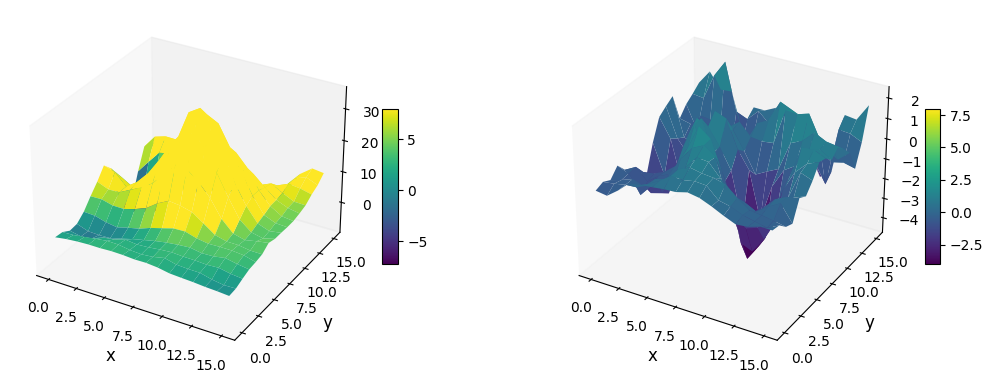

In [ ]:
plot_frames((cropped_frame1, cropped_frame2), mode='surface', vmax=8)

New shape: (110, 110)
New shape: (110, 110)


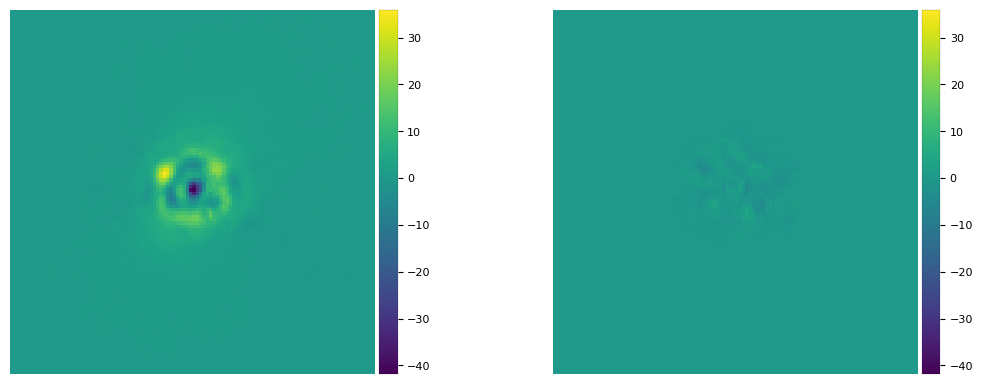

In [ ]:
plot_frames((frame_crop(final_opt,110), frame_crop(fr_pca_emp,110)), vmin = float(np.amin(final_opt)),
            vmax= float(np.amax(final_opt)), axis=False)

### Injecting more fake planets

In [ ]:
def fakecompanion(rad, theta, flux):
    cubefc = cube_inject_companions(cube, psf_template=psfn, angle_list=angle, flevel=flux, plsc=pxscale_sphere,
                                rad_dists=[rad], theta=theta, n_branches=1,
                                imlib=imlib2, interpolation=interpolation2)
    cy, cx = frame_center(cube[0])
    x = cx + rad*np.cos(np.deg2rad(theta))
    y = cy + rad*np.sin(np.deg2rad(theta))
    xy_test = (x, y)

    res_opt = pca_grid(cubefc, angle, cube_ref=cube_ref, fwhm=fwhm_sphere, range_pcs=(1,16,1), source_xy=xy_test,
                       imlib=imlib2, interpolation=interpolation2, full_output=True, plot=True)
    _, final_opt, _, opt_npc = res_opt
    r_0, theta_0, f_0 = firstguess(cubefc, angle, psfn, ncomp=opt_npc, planets_xy_coord=[xy_test],
                                  fwhm=fwhm_sphere, cube_ref=cube_ref, f_range=None, simplex=True, imlib=imlib2,
                                  interpolation=interpolation2, plot=True, verbose=True)
    return cubefc, res_opt, r_0, theta_0, f_0

    
    

In [ ]:
fc = [[20,130,300], [10,100,100], [30, 70, 150], [30,160,90]]

In [ ]:
fc[0][1]

130

In [ ]:
for i in fc:
    fakecompanion(i[0], i[1], i[2])

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-24 23:30:13
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.664141
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


KeyboardInterrupt: 

### NEGFC technique coupled with MCMC (for one fake planet)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-31 16:35:40
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:00.688096
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Number of steps 16
Optimal number of PCs = 2, for S/N=13.447
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 499.1, 527.3
Flux in a centered 1xFWHM circular aperture = 359.092
Central pixel S/N = 18.421
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 13.447
Max S/N (shifting the aperture center) = 21.785
stddev S/N (shifting the aperture center) = 5.240

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-31 16:36:27
――

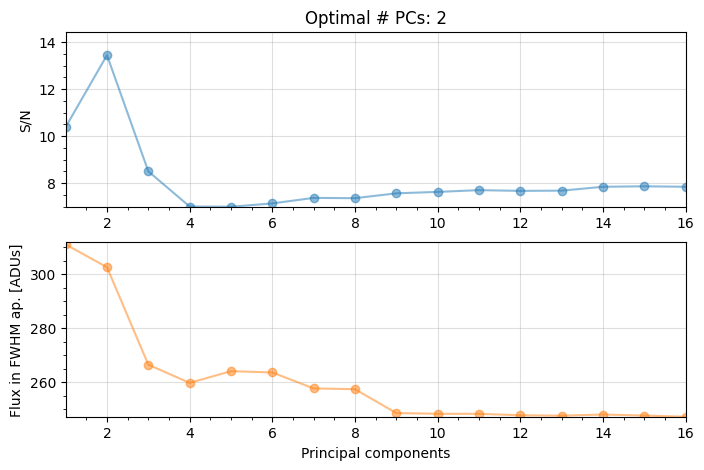

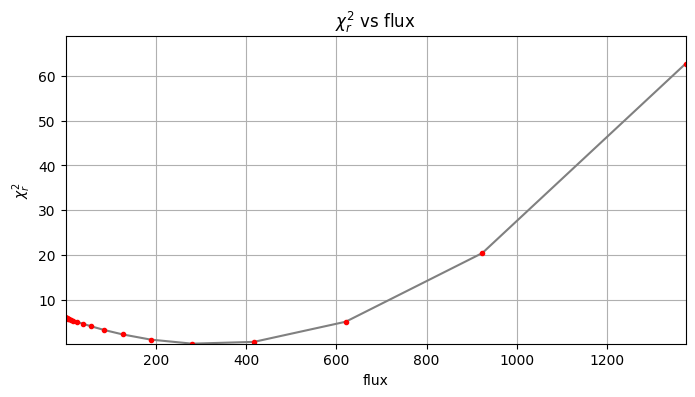

Planet 0: preliminary position guess: (r, theta)=(20.0, 130.0)
Planet 0: preliminary flux guess: 280.7
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 143, nfev: 300, chi2r: 0.016284420683577255
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(19.942, 129.616, 322.922) at 
          (X,Y)=(499.28, 527.36)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:08:31.615282
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
fake_c = fakecompanion(fc[0][0], fc[0][1], fc[0][2])

In [ ]:
fake_c[2][0]

19.941915264158844

In [ ]:
obs_params = {'psfn': psfn,
              'fwhm': fwhm_sphere}

In [ ]:
annulus_width = 4*fwhm_sphere

algo_params = {'algo': pca,
               'ncomp': fake_c[1][3],
               'svd_mode': 'lapack',
               'imlib': imlib2,
               'interpolation': interpolation2}

In [ ]:
mu_sigma=True
aperture_radius=2

negfc_params = {'mu_sigma': mu_sigma,
                'aperture_radius': aperture_radius}

In [ ]:
initial_state = np.array([fake_c[2][0], fake_c[3][0], fake_c[4][0]])

In [ ]:
from multiprocessing import cpu_count

nwalkers, itermin, itermax = (10, 200, 500)

mcmc_params = {'nwalkers': nwalkers,
               'niteration_min': itermin,
               'niteration_limit': itermax,
               'bounds': None,
               'nproc': cpu_count()//2}

In [ ]:
conv_test, ac_c, ac_count_thr, check_maxgap = ('ac', 50, 1, 10)

conv_params = {'conv_test': conv_test,
               'ac_c': ac_c,
               'ac_count_thr': ac_count_thr,
               'check_maxgap': check_maxgap}

In [ ]:
chain = mcmc_negfc_sampling(fake_c[0], angle, **obs_params, **algo_params, **negfc_params,
                            initial_state=initial_state, **mcmc_params, **conv_params,
                            display=True, verbosity=2, save=False, output_dir='./')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-31 16:52:27
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
        MCMC sampler for the NEGFC technique       
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
The mean and stddev in the annulus at the radius of the companion (excluding the PA area directly adjacent to it) are -0.17 and 2.82 respectively.
Beginning emcee Ensemble sampler...
emcee Ensemble sampler successful

Start of the MCMC run ...
Step  |  Duration/step (sec)  |  Remaining Estimated Time (sec)


KeyboardInterrupt: 

In [ ]:
help(mcmc_negfc_sampling)

Help on function mcmc_negfc_sampling in module vip_hci.fm.negfc_mcmc:

mcmc_negfc_sampling(cube, angs, psfn, initial_state, algo=<function pca_annulus at 0x7f55e4efa8b0>, ncomp=1, annulus_width=8, aperture_radius=1, fwhm=4, mu_sigma=True, sigma='spe+pho', force_rPA=False, fmerit='sum', cube_ref=None, svd_mode='lapack', scaling=None, delta_rot=1, imlib='vip-fft', interpolation='lanczos4', collapse='median', algo_options={}, wedge=None, weights=None, transmission=None, nwalkers=100, bounds=None, a=2.0, burnin=0.3, rhat_threshold=1.01, rhat_count_threshold=1, niteration_min=10, niteration_limit=10000, niteration_supp=0, check_maxgap=20, conv_test='ac', ac_c=50, ac_count_thr=3, nproc=1, output_dir='results/', output_file=None, display=False, verbosity=0, save=False)
    Runs an affine invariant mcmc sampling algorithm in order to determine
    the position and the flux of the planet using the 'Negative Fake Companion'
    technique. The result of this procedure is a chain with the samples 

### Plotting the disk structures  

In [ ]:
from astropy.visualization import (AsinhStretch, LinearStretch, LogStretch, ImageNormalize)
from matplotlib.patches import Ellipse
import matplotlib.gridspec as gridspec
import scipy.ndimage
from matplotlib.offsetbox import AnchoredOffsetbox, AuxTransformBox, DrawingArea, TextArea, VPacker
from matplotlib.patches import Rectangle

In [ ]:
fig = plt.figure(figsize=(10, 9))
gs  = gridspec.GridSpec(2, 2, figure = fig, width_ratios=(1, 1), height_ratios=(1, 1))
norm = ImageNormalize(vmin=-5,vmax=5, stretch=LinearStretch())
fig_size = 1.2

<Figure size 1000x900 with 0 Axes>

In [ ]:
aoff, doff = 0,0 #-0.89,0.9
RA_CO  = -12.25e-3 * (np.arange(cubefits[0].header['NAXIS1'])-(512))
DEC_CO = 12.25e-3 * (np.arange(cubefits[0].header['NAXIS2'])-(512))
ext_CO = (np.max(RA_CO)-aoff, np.min(RA_CO)-aoff, np.min(DEC_CO)-doff, np.max(DEC_CO)-doff)

In [ ]:
def mk_ellipse(x0,y0,R,incl,PA, npts=200):
    phi = 2.*np.pi*np.arange(npts)/(npts-1.)
    incl_rad = incl * np.pi/180.
    PA_rad = (PA) * np.pi/180.
    xell = R*np.cos(phi)*np.cos(incl_rad)
    yell = R*np.sin(phi)
    xrot = ( (xell)*np.cos(PA_rad) + (yell)*np.sin(PA_rad) ) + x0
    yrot = (-(xell)*np.sin(PA_rad) + (yell)*np.cos(PA_rad) ) + y0
    return [xrot, yrot]

In [ ]:
#gap radius, offsets,inclination and position angle
g1 = 503e-3
x0g1, y0g1 = -2e-3, -4e-3
ig1 = 35.8
PAg1 = 86.1

g2 = 872e-3
x0g2, y0g2 = 1e-3, 0e-3
ig2 = 35
PAg2 = 85.6
#ring radius, offsets,inclination and position angle
r1 = 992.9e-3
x0r1, y0r1 = -0.8e-3, -4.4e-3 # consider this as outer disk offsets
ir1 = 34.92
PAr1 = 85.7

r2 = 612.8e-3
x0r2, y0r2 = 0.2e-3, 2.1e-3 # consider this as outer disk offsets
ir2 = 34.92
PAr2 = 85.6

In [ ]:
#gap ellipse
xg1, yg1 = mk_ellipse(x0g1,y0g1,g1,ig1,PAg1,5000)
xg2, yg2 = mk_ellipse(x0g2,y0g2,g2,ig2,PAg2,5000)
xr1, yr1 = mk_ellipse(x0r1,y0r1,r1,ir1,PAr1,500)
xr2, yr2 = mk_ellipse(x0r2,y0r2,r2,ir2,PAr2,500)

In [ ]:
# PA and center for outer disk
PA = PAr1*np.pi/180.
x0 = x0r1
y0 = y0r1
xPa = [x0 + 2.5 * np.sin(PA) -x0r1, x0 - 2.5 * np.sin(PA)-x0r1]
yPa = [y0 + 2.5 * np.cos(PA) -y0r1, y0 - 2.5 * np.cos(PA)-y0r1]
xPa2 = [x0 - 2.5 * np.cos(PA) -x0r1 , x0 + 2.5 * np.cos(PA) - x0r1]
yPa2 = [y0 + 2.5 * np.sin(PA) -y0r1, y0 - 2.5 * np.sin(PA)-y0r1]

In [ ]:
fr_pca1.shape

(1024, 1024)

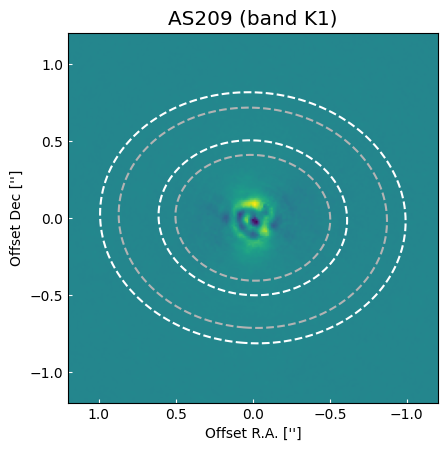

In [ ]:
ax1 = fig.add_subplot(gs[0,0])
masked_array = np.ma.array(fr_pca1, mask=np.isnan(fr_pca1))
im1 = plt.imshow(masked_array, extent=ext_CO)
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.7')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.7')